<a href="https://colab.research.google.com/github/oliviachchoi/SDproject-bike-/blob/main/EDA_0721_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#만든 최종 데이터셋 불러오기

하나의 가설: 
한강 근처의 대여소들이 다른 대여소보다 시간대별 대여량이 많을 것이다.

##최종 데이터 셋

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df=pd.read_csv('/content/drive/MyDrive/따릉이 project/만든 데이터/찐/final_data_2.csv',encoding='UTF-8')

In [40]:
df.shape

(359520, 14)

In [41]:
df.drop('Unnamed: 0',axis=1, inplace=True)

In [42]:
df.head()

,year,month,day,hour,stno,stname,num,미세먼지 평균,초미세먼지 평균,rainval,tempval,humval,windval
0,2020,1,1,0,2213,고속터미널역 5번출구 앞,1,28.0,17.0,0.0,-3.7,78.0,1.4
1,2020,1,1,0,2222,사당역 12번출구 뒤,1,28.0,17.0,0.0,-3.7,78.0,1.4
2,2020,1,1,0,2251,더케이호텔 입구(양재2),1,28.0,17.0,0.0,-3.7,78.0,1.4
3,2020,1,1,0,2256,양재동 꽃시장 입구,1,28.0,17.0,0.0,-3.7,78.0,1.4
4,2020,1,1,0,2268,서초4동주민센터,2,28.0,17.0,0.0,-3.7,78.0,1.4


## dates (2020.01~12) 데이터

In [43]:
dates=pd.read_csv('/content/drive/MyDrive/따릉이 project/만든 데이터/찐/dates.csv',encoding='UTF-8')

In [44]:
dates.drop('Unnamed: 0',axis=1, inplace=True)

In [45]:
dates

,year,month,day,hour
0,2020,1,1,0
1,2020,1,1,1
2,2020,1,1,2
3,2020,1,1,3
4,2020,1,1,4
...,...,...,...,...
8779,2020,12,31,19
8780,2020,12,31,20
8781,2020,12,31,21
8782,2020,12,31,22


## station match : 따릉이 정류소 번호와 이름 매치한 데이터

In [46]:
#station no와 stname을 따로 newDF 로 빼두기
station_match= df[['stno','stname']]
station_match=station_match.drop_duplicates(keep='first')

In [47]:
station_match

,stno,stname
0,2213,고속터미널역 5번출구 앞
1,2222,사당역 12번출구 뒤
2,2251,더케이호텔 입구(양재2)
3,2256,양재동 꽃시장 입구
4,2268,서초4동주민센터
...,...,...
151764,2519,서초2교(사임당로 방면)
158784,2524,반포쇼핑타운 8동 앞
166850,2550,양재동 꽃시장 건너편
190707,2539,대한무역투자진흥공사 KOTRA 앞


In [48]:
df.drop('stname',axis=1, inplace=True)

In [49]:
df

,year,month,day,hour,stno,num,미세먼지 평균,초미세먼지 평균,rainval,tempval,humval,windval
0,2020,1,1,0,2213,1,28.0,17.0,0.0,-3.7,78.0,1.4
1,2020,1,1,0,2222,1,28.0,17.0,0.0,-3.7,78.0,1.4
2,2020,1,1,0,2251,1,28.0,17.0,0.0,-3.7,78.0,1.4
3,2020,1,1,0,2256,1,28.0,17.0,0.0,-3.7,78.0,1.4
4,2020,1,1,0,2268,2,28.0,17.0,0.0,-3.7,78.0,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...
359515,2020,12,31,23,2294,1,24.0,10.0,0.0,-6.6,63.0,0.8
359516,2020,12,31,23,2502,1,24.0,10.0,0.0,-6.6,63.0,0.8
359517,2020,12,31,23,2508,1,24.0,10.0,0.0,-6.6,63.0,0.8
359518,2020,12,31,23,2524,1,24.0,10.0,0.0,-6.6,63.0,0.8


# 데이터 시각화 하기 = 서초구 전체

In [50]:
#month, day,hour 별 대여수 분포 확인하기

df_month=df[['month','num']]
df_day= df[['day','num']]
df_hour= df[['hour','num']]

#groupby
df_month=df_month.groupby('month').sum()
df_day= df_day.groupby('day').sum()
df_hour= df_hour.groupby('hour').sum()

In [51]:
#plotting
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=1,
                    subplot_titles=('month','day','hour'))

fig.append_trace(go.Bar(
    x=df_month.index,
    y=df_month.num,
    ), row=1, col=1)

fig.append_trace(go.Bar(
    x=df_day.index,
    y=df_day.num,
    ), row=2, col=1)

fig.append_trace(go.Bar(
    x=df_hour.index,
    y=df_hour.num,
    ), row=3, col=1)

fig.update_layout(height=1000, width=1000, title_text="SubPlots by month,day, hour")
fig.show()

In [52]:
fig = make_subplots(rows=4, cols=1,
                    subplot_titles=('rain','temperature','humidity','wind speed'))

fig.append_trace(go.Scatter(
    x=df.rainval,
    y=df.num,
    ), row=1, col=1)

fig.append_trace(go.Scatter(
    x=df.tempval,
    y=df.num,
    ), row=2, col=1)


fig.append_trace(go.Scatter(
    x=df.humval,
    y=df.num,
    ), row=3, col=1)


fig.append_trace(go.Scatter(
    x=df.windval,
    y=df.num,
    ), row=4, col=1)


fig.update_layout(height=1000, width=1000, title_text="SubPlots by weather values")
fig.show()

## 미세먼지 기준에 따라서 feature engineering 해줌

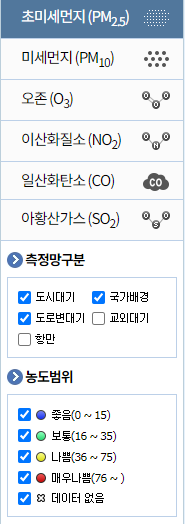 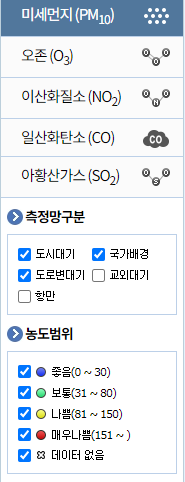

출처 : 에어코리아(https://www.airkorea.or.kr/web)

[Text(0.5, 1.0, 'ultra fine dust')]

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 48120 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 49464 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 47676 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 51648 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 54217 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 44512 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning:

Glyph 48120 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotli

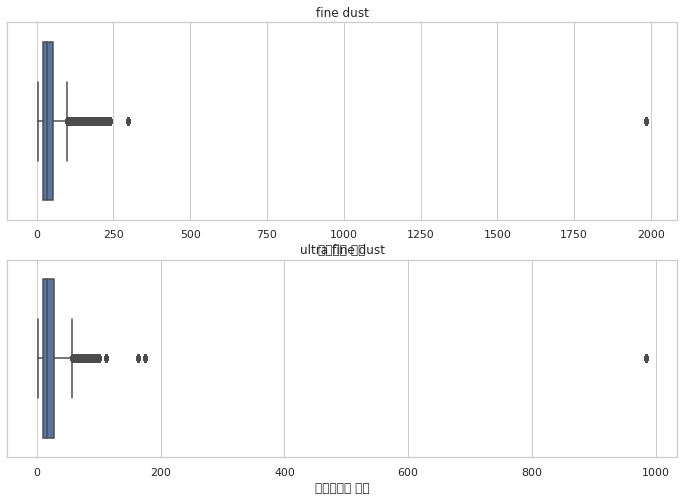

In [53]:
figure, (ax1, ax2)= plt.subplots(nrows=2, ncols=1)
figure.set_size_inches(12,8)
sns.boxplot(data=df, x=df['미세먼지 평균'], ax=ax1)
sns.boxplot(data=df, x=df['초미세먼지 평균'], ax=ax2)

ax1.set(title="fine dust")
ax2.set(title='ultra fine dust')

극한의 이상치를 보여주고 있다.
위의 기준표를 따라서 범주화를 해서 이상치를 잡아보겠다.

In [55]:
#미세먼지
df.loc[df['미세먼지 평균']<=30,'미세먼지 평균']= 1
df.loc[(df['미세먼지 평균']>30)&(df['미세먼지 평균']<=80),'미세먼지 평균']=2
df.loc[(df['미세먼지 평균']>80)&(df['미세먼지 평균']<=150),'미세먼지 평균']=3
df.loc[df['미세먼지 평균']>150,'미세먼지 평균']= 4

#초미세먼지
df.loc[df['초미세먼지 평균']<=15,'초미세먼지 평균']= 1
df.loc[(df['초미세먼지 평균']>15) &(df['초미세먼지 평균']<=35),'초미세먼지 평균']=2
df.loc[(df['초미세먼지 평균']>35) &(df['초미세먼지 평균']<=75),'초미세먼지 평균']=3
df.loc[df['초미세먼지 평균']>75,'초미세먼지 평균']= 4

In [56]:
print('미세먼지: \n', df['미세먼지 평균'].value_counts())
print('초미세먼지: \n', df['초미세먼지 평균'].value_counts())

미세먼지: 
 2.0    177096
1.0    154044
3.0     24344
4.0      4036
Name: 미세먼지 평균, dtype: int64
초미세먼지: 
 1.0    169472
2.0    131862
3.0     53077
4.0      5109
Name: 초미세먼지 평균, dtype: int64


### binning된 미세, 초미세로 그래프 찍어보기

In [71]:
fine_dust= df[['미세먼지 평균','num']].groupby(by='미세먼지 평균',as_index=False).sum()
ultra_fine_dust= df[['초미세먼지 평균','num']].groupby(by='초미세먼지 평균',as_index=False).sum()

In [72]:
fine_dust

,미세먼지 평균,num
0,1.0,383949
1,2.0,453734
2,3.0,58226
3,4.0,10715


In [73]:
fig = make_subplots(rows=2, cols=1,
                    subplot_titles=('fine dust','ultra fine dust'))

fig.append_trace(go.Bar(
    x=fine_dust['미세먼지 평균'],
    y=fine_dust.num,
    ), row=1, col=1)

fig.append_trace(go.Bar(
    x=ultra_fine_dust['초미세먼지 평균'],
    y=ultra_fine_dust.num,
    ), row=2, col=1)
fig.show()

# 대여수 분포 확인 및 EDA

In [75]:
#df num
df.num.value_counts()

1     173467
2      79880
3      40812
4      22981
5      13602
       ...  
82         1
83         1
88         1
65         1
90         1
Name: num, Length: 75, dtype: int64

In [95]:
df[df.num>30]['stno'].unique()

array([2219, 2262, 2217, 2220, 2214, 2255, 2252, 2525])

In [96]:
#1분에 한대라 치면 한시간에 최대 60개를 잡아서 빌릴 수 있다고 생각함
df[df.num>60]['stno'].unique()
#대여 횟수의 이상치를 보니 다 2219번 대여소이다.

array([2219, 2217])

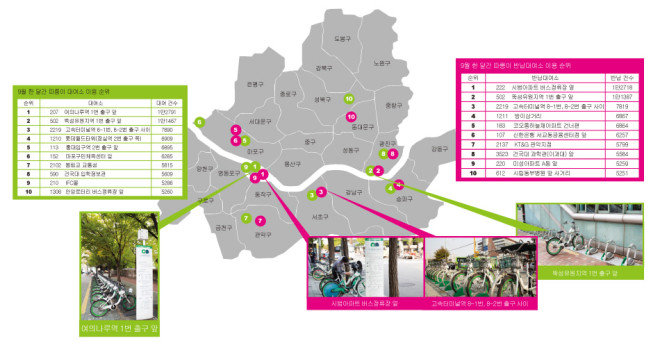
출처: 주간동아(https://weekly.donga.com/3/all/11/1508465/1)

In [77]:
#but 실제로 이상치이며, 처리를 해야할까?
station_match[station_match['stno']==2219]

,stno,stname
10,2219,"고속터미널역 8-1번, 8-2번 출구 사이"


In [86]:
station_match[station_match['stno']==2217]

,stno,stname
45,2217,아크로리버뷰 부지 앞


위치를 보아하니, 실제로 반포한강공원이랑 가까운 정류소들, 
서초구 따릉이 대여소 중 가장 대여수가 많다.

따라서 위 데이터를 이상치로 보지 않고 drop하지 않겠다.

----folium, geomap 사용해서 실제 좌표 찍어보기 & 한강이랑 가까운지, 및 왜 많은지에 대한 이용분석

In [87]:
df_not=df[(df.stno!=2219)&(df.stno!=2217)]

In [88]:
df_not['num'].unique()

array([ 1,  2,  3,  8,  4,  5,  6,  7, 11,  9, 12, 20, 10, 13, 15, 14, 18,
       17, 28, 16, 22, 24, 21, 31, 25, 35, 19, 30, 41, 37, 27, 54, 40, 36,
       29, 23, 33, 26, 32, 46, 50, 51, 39, 38, 56, 34, 49, 42, 44, 47, 45,
       55, 53, 43])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



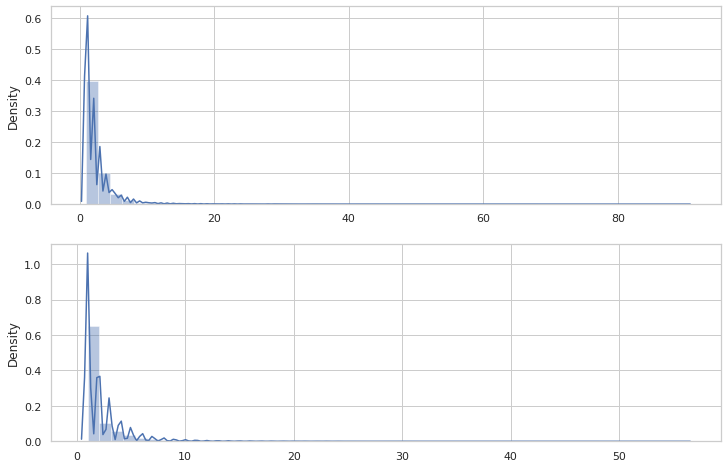

In [93]:
figure, (ax1, ax2)= plt.subplots(nrows=2, ncols=1)
figure.set_size_inches(12,8)
sns.distplot(x=df.num, ax=ax1)
sns.distplot(x=df_not.num, ax=ax2)

In [97]:
df.num.describe()
#한시간에 평균적으로 2.5대 정도 빌려가는 것 같지만, 
#예외적으로 몇 대여소에는 한시간에 90대씩 빌려 가기도 한다.
#대부분 한강 근처 정류소.

count    359520.000000
mean          2.521762
std           3.151690
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max          90.000000
Name: num, dtype: float64

#요일 feature engineering

In [98]:
df

,year,month,day,hour,stno,num,미세먼지 평균,초미세먼지 평균,rainval,tempval,humval,windval
0,2020,1,1,0,2213,1,1.0,2.0,0.0,-3.7,78.0,1.4
1,2020,1,1,0,2222,1,1.0,2.0,0.0,-3.7,78.0,1.4
2,2020,1,1,0,2251,1,1.0,2.0,0.0,-3.7,78.0,1.4
3,2020,1,1,0,2256,1,1.0,2.0,0.0,-3.7,78.0,1.4
4,2020,1,1,0,2268,2,1.0,2.0,0.0,-3.7,78.0,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...
359515,2020,12,31,23,2294,1,1.0,1.0,0.0,-6.6,63.0,0.8
359516,2020,12,31,23,2502,1,1.0,1.0,0.0,-6.6,63.0,0.8
359517,2020,12,31,23,2508,1,1.0,1.0,0.0,-6.6,63.0,0.8
359518,2020,12,31,23,2524,1,1.0,1.0,0.0,-6.6,63.0,0.8


#IDEA 1. 강수량 많=> 장마, 풍속 빠=> 태풍 등의 천재지변이라는 변수를 생성 할 수 있나?